### 1 DATA LOADING

In [2]:
#importing the liberaries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
#Uploading a data
from google.colab import files
files.upload()

Saving hotel_bookings.csv to hotel_bookings.csv


{'hotel_bookings.csv': b'hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date\r\nResort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,07-01-2015\r\nResort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,07-01-2015\r\nResort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NULL,NULL,0,Transient,75,0,0,Check-Out,07-02-2015\r\nResort Hotel,0,13,2015,July,27,

In [4]:
#creating a dataframe
df=pd.read_csv("hotel_bookings.csv")

In [5]:
# showing top 5 rows of data
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,07-01-2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,07-01-2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,07-02-2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,07-02-2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,07-03-2015


### 2. DATA CLEANING

In [6]:
#rows X columns
df.shape

(119390, 32)

In [7]:
# checking the null value
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [8]:
 #defining functon for filling missing value
 def data_clean(df):
  df.fillna(0,inplace=True)
  print(df.isnull().sum())

In [9]:
#calling the function
data_clean(df)

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
company                           0
days_in_waiting_list              0
customer_type                     0
adr                         

In [10]:
#listing the columns name
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [11]:
# checking the number of unique value of the features
list=['adults','children','babies']
for i in list:
  print(df[i].unique())

[ 2  1  3  4 40 26 50 27 55  0 20  6  5 10]
[ 0.  1.  2. 10.  3.]
[ 0  1  2 10  9]


In [12]:
#creating filter with conditions
filter=(df['children']==0) & (df['adults']==0) & (df['babies']==0)
df[filter]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
2224,Resort Hotel,0,1,2015,October,41,6,0,3,0,...,No Deposit,0.0,174.0,0,Transient-Party,0.00,0,0,Check-Out,10-06-2015
2409,Resort Hotel,0,0,2015,October,42,12,0,0,0,...,No Deposit,0.0,174.0,0,Transient,0.00,0,0,Check-Out,10-12-2015
3181,Resort Hotel,0,36,2015,November,47,20,1,2,0,...,No Deposit,38.0,0.0,0,Transient-Party,0.00,0,0,Check-Out,11/23/2015
3684,Resort Hotel,0,165,2015,December,53,30,1,4,0,...,No Deposit,308.0,0.0,122,Transient-Party,0.00,0,0,Check-Out,01-04-2016
3708,Resort Hotel,0,165,2015,December,53,30,2,4,0,...,No Deposit,308.0,0.0,122,Transient-Party,0.00,0,0,Check-Out,01-05-2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115029,City Hotel,0,107,2017,June,26,27,0,3,0,...,No Deposit,7.0,0.0,0,Transient,100.80,0,0,Check-Out,6/30/2017
115091,City Hotel,0,1,2017,June,26,30,0,1,0,...,No Deposit,0.0,0.0,0,Transient,0.00,1,1,Check-Out,07-01-2017
116251,City Hotel,0,44,2017,July,28,15,1,1,0,...,No Deposit,425.0,0.0,0,Transient,73.80,0,0,Check-Out,7/17/2017
116534,City Hotel,0,2,2017,July,28,15,2,5,0,...,No Deposit,9.0,0.0,0,Transient-Party,22.86,0,1,Check-Out,7/22/2017


In [13]:
### seems to have some dirtiness in data as Adults,babies & children cant be zero at a same time ..

### bcz if 3 entities are 0 ,then how can a booking be possible ??

In [14]:
#negation of filter
data = df[~filter] #The task of not is to reverse the truth value of its operand
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,07-01-2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,07-01-2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.00,0,0,Check-Out,07-02-2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.00,0,0,Check-Out,07-02-2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.00,0,1,Check-Out,07-03-2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,0.0,0,Transient,96.14,0,0,Check-Out,09-06-2017
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,0.0,0,Transient,225.43,0,2,Check-Out,09-07-2017
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,0.0,0,Transient,157.71,0,4,Check-Out,09-07-2017
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,0.0,0,Transient,104.40,0,0,Check-Out,09-07-2017


In [15]:
print(data.shape)
print(df.shape)

(119210, 32)
(119390, 32)


### 3.Exploratory Data Analysis (SPATIAL ANALYSIS)
(Visualisation of data on some map so that you get clear cut information about data)

**1.> Where do the guests come from ?**

In [147]:
#filtering data based on is_canceled feature ,accessing the country and counting the value
data[data['is_canceled']==0]['country'].value_counts()

PRT    20977
GBR     9668
FRA     8468
ESP     6383
DEU     6067
       ...  
BHR        1
DJI        1
MLI        1
NPL        1
FRO        1
Name: country, Length: 166, dtype: int64

In [148]:
#reset_index() takes the current index, and places it in column 'index'. Then it recreates a new 'linear' index for the data-set.
country_wise_data=data[data['is_canceled']==0]['country'].value_counts().reset_index()
country_wise_data

,index,country
0,PRT,20977
1,GBR,9668
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
161,BHR,1
162,DJI,1
163,MLI,1
164,NPL,1


In [149]:
# modifying column name
country_wise_data.columns=['country','no_of_guests']
country_wise_data

,country,no_of_guests
0,PRT,20977
1,GBR,9668
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
161,BHR,1
162,DJI,1
163,MLI,1
164,NPL,1


In [150]:
 # importing liberaries
 !pip install folium

In [151]:
import folium
from folium.plugins import HeatMap
basemap= folium.Map()

In [152]:
#plotly is advanced level data visualisation liberaries which is used for deployment level result
!pip install plotly
import plotly.express as px

In [153]:
#plotting choropleth map(is a thematic map that is used to represent statistical data using the color mapping symbology technique.)
map_guest=px.choropleth(country_wise_data,
             locations=country_wise_data['country'],
             color=country_wise_data['no_of_guests'],
              hover_name=country_wise_data['country'],
              title='Home country of guests',
               color_continuous_scale='YlOrRd'
             )
map_guest.show()

Conclusion:

there are 80 to 85% of countries that have almost bewtween 0 to 5000 guests.
And there are few countries ,which are exactly portugal and some European countries where we have maximum number of guest.


**2.>How much do guests pay for a room per night ?**

(need to know the price distribution of each room type)

In [154]:
data2=data[data['is_canceled']==0]
data2.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

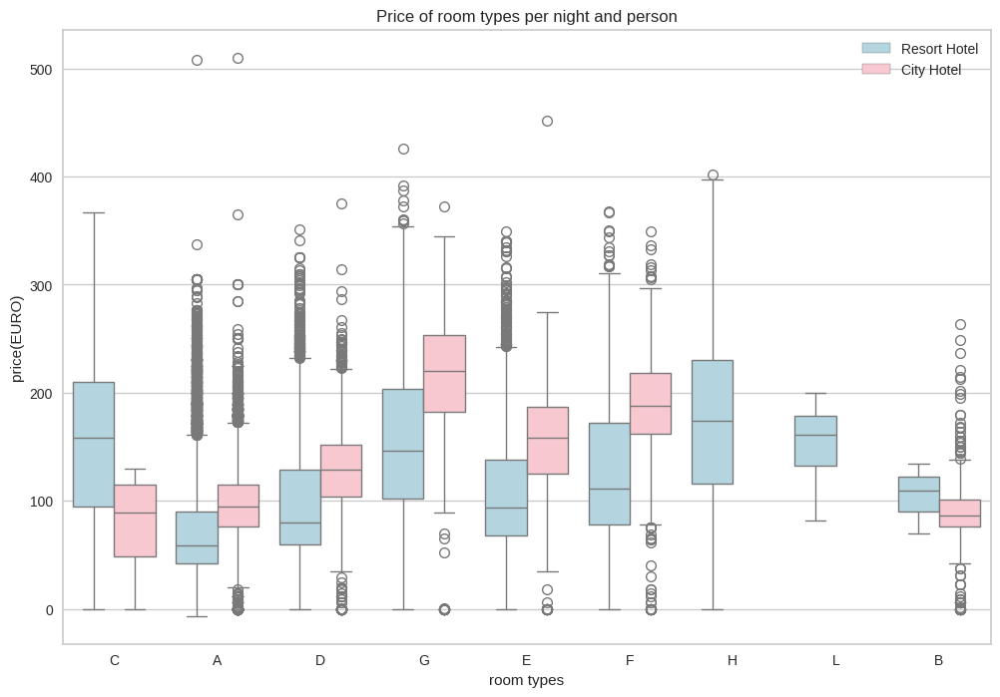

In [155]:
# seaborn boxplot:
plt.figure(figsize=(12,8))
sns.boxplot(x='reserved_room_type',y='adr' ,hue='hotel',data=data2, palette= ['lightblue', 'pink'])

plt.title('Price of room types per night and person')
plt.xlabel('room types')
plt.ylabel('price(EURO)')
plt.legend()
plt.show()


CONCLUSION:

the best distribution with respect to City Hotel is almost with G type, whereas resort hotel, the best distribution of price is almost with H room type

**3.> how does price per night vary over the year?**

(Considering both hotel type for this)

In [156]:
# preparing data for this problem statement
data_resort = data[(data['hotel']=='Resort Hotel') & (data['is_canceled']==0)]
data_city = data[(data['hotel']=='City Hotel') & (data['is_canceled']==0)]

In [157]:
data_resort.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,07-01-2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,07-01-2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,07-02-2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,07-02-2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,07-03-2015


In [158]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_month,adr
0,April,75.867816
1,August,181.205892
2,December,68.410104
3,February,54.147478
4,January,48.761125
5,July,150.122528
6,June,107.974850
7,March,57.056838
8,May,76.657558
9,November,48.706289


In [159]:
city_hotel = data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.962267
1,August,118.674598
2,December,88.401855
3,February,86.520062
4,January,82.330983
5,July,115.818019
6,June,117.874360
7,March,90.658533
8,May,120.669827
9,November,86.946592


In [160]:
#merge the data of above 2
final = resort_hotel.merge(city_hotel, on ='arrival_date_month')
final.columns = ['month','price_for_resort','price_for_city_hotel']
final

,month,price_for_resort,price_for_city_hotel
0,April,75.867816,111.962267
1,August,181.205892,118.674598
2,December,68.410104,88.401855
3,February,54.147478,86.520062
4,January,48.761125,82.330983
5,July,150.122528,115.818019
6,June,107.974850,117.874360
7,March,57.056838,90.658533
8,May,76.657558,120.669827
9,November,48.706289,86.946592


In [161]:
#set the proper herarchy of month column
!pip install sort_dataframeby_monthorweek
!pip install sorted-months-weekdays

In [162]:
import sort_dataframeby_monthorweek as sd
def sort_data(df,colname):
  return sd.Sort_Dataframeby_Month(df,colname)

In [163]:
final = sort_data(final,'month')
final

,month,price_for_resort,price_for_city_hotel
0,January,48.761125,82.330983
1,February,54.147478,86.520062
2,March,57.056838,90.658533
3,April,75.867816,111.962267
4,May,76.657558,120.669827
5,June,107.974850,117.874360
6,July,150.122528,115.818019
7,August,181.205892,118.674598
8,September,96.416860,112.776582
9,October,61.775449,102.004672


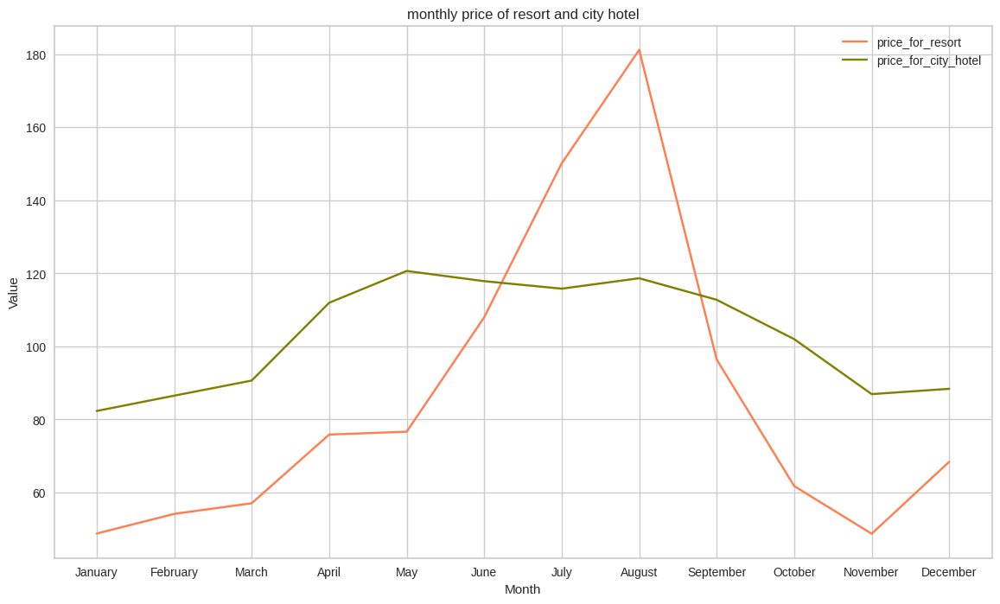

In [164]:
plt.figure(figsize=(14,8))
plt.plot(final.month, final.price_for_resort, label="price_for_resort", color='coral')
plt.plot(final.month, final.price_for_city_hotel, label="price_for_city_hotel",color = 'olive')
plt.xlabel("Month")
plt.ylabel("Value")
plt.title("monthly price of resort and city hotel")
plt.legend()
plt.grid(True)
plt.show()

Conclusion:
it clearly shows that prices in the resort hotel are much higher during the summer and the prices for the city hotel will rise very less. it is most expensive during basically autumn.

**4.> which are the most busy month or in which months guests are high??**

In [165]:
rush_resort=data_resort['arrival_date_month'].value_counts().reset_index()
rush_resort.columns=['month','no_of_guests']
rush_resort

,month,no_of_guests
0,August,3257
1,July,3137
2,October,2575
3,March,2571
4,April,2550
5,May,2535
6,February,2308
7,September,2102
8,June,2037
9,December,2014


In [166]:
rush_city=data_city['arrival_date_month'].value_counts().reset_index()
rush_city.columns=['month','no_of_guests']
rush_city

,month,no_of_guests
0,August,5367
1,July,4770
2,May,4568
3,June,4358
4,October,4326
5,September,4283
6,March,4049
7,April,4010
8,February,3051
9,November,2676


In [167]:
final_rush=rush_resort.merge(rush_city,on='month')
final_rush.columns=['month','no_of_guests_in_resort','no_of_guests_city']
final_rush

,month,no_of_guests_in_resort,no_of_guests_city
0,August,3257,5367
1,July,3137,4770
2,October,2575,4326
3,March,2571,4049
4,April,2550,4010
5,May,2535,4568
6,February,2308,3051
7,September,2102,4283
8,June,2037,4358
9,December,2014,2377


In [168]:
final_rush=sd.Sort_Dataframeby_Month(final_rush,'month')
final_rush

,month,no_of_guests_in_resort,no_of_guests_city
0,January,1866,2249
1,February,2308,3051
2,March,2571,4049
3,April,2550,4010
4,May,2535,4568
5,June,2037,4358
6,July,3137,4770
7,August,3257,5367
8,September,2102,4283
9,October,2575,4326


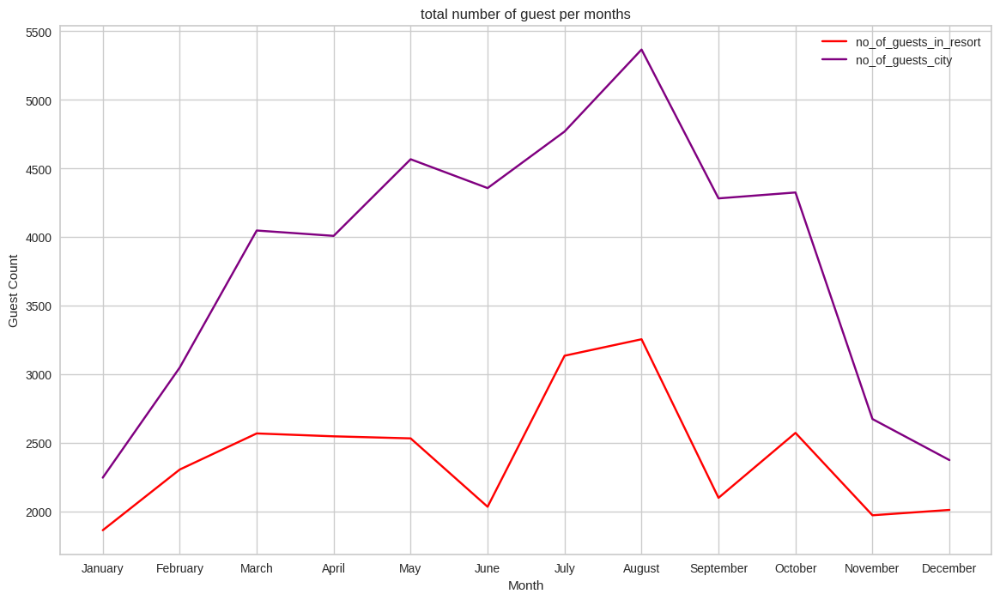

In [169]:
plt.figure(figsize=(14,8))
plt.plot(final_rush.month, final_rush.no_of_guests_in_resort, label="no_of_guests_in_resort", color='red')
plt.plot(final_rush.month, final_rush.no_of_guests_city, label="no_of_guests_city",color = 'purple')
plt.xlabel("Month")
plt.ylabel("Guest Count")
plt.title("total number of guest per months")
plt.legend()
plt.grid(True)
plt.show()

Conclusion:

the City Hotel has more guest during spring and autumn in July and August.There are less visitors you will observe, although prices are lower.

Whereas with respect to this resort hotel,Guest member for this resort hotel go down slightly from June to September. which is also when the prices is higher.

**5.> Visualizing correlation coefficients between features and cancellation:**

In [170]:
#finding co-relation between each and every features.
data.corr()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
is_canceled,1.000000,0.292876,0.016622,0.008315,-0.005948,-0.001323,0.025542,0.058182,0.004851,-0.032569,-0.083745,0.110139,-0.057365,-0.144832,-0.046770,-0.083594,0.054301,0.046492,-0.195701,-0.234877
lead_time,0.292876,1.000000,0.040334,0.127046,0.002306,0.085985,0.166892,0.117575,-0.037878,-0.021003,-0.123209,0.086025,-0.073599,0.002230,-0.013114,-0.085854,0.170008,-0.065018,-0.116624,-0.095949
arrival_date_year,0.016622,0.040334,1.000000,-0.540373,-0.000121,0.021694,0.031203,0.030266,0.054710,-0.013192,0.010281,-0.119905,0.029234,0.031416,0.056438,0.033682,-0.056348,0.198429,-0.013812,0.108610
arrival_date_week_number,0.008315,0.127046,-0.540373,1.000000,0.066572,0.018629,0.016047,0.026567,0.005556,0.010417,-0.031125,0.035493,-0.021009,0.006311,-0.018225,-0.032912,0.022677,0.076281,0.001980,0.026202
arrival_date_day_of_month,-0.005948,0.002306,-0.000121,0.066572,1.000000,-0.016225,-0.028362,-0.001754,0.014550,-0.000235,-0.006471,-0.027027,-0.000306,0.011266,0.000159,0.003667,0.022532,0.030291,0.008569,0.003026
stays_in_weekend_nights,-0.001323,0.085985,0.021694,0.018629,-0.016225,1.000000,0.494175,0.094759,0.046135,0.018607,-0.086009,-0.012769,-0.042859,0.050191,0.162411,-0.080783,-0.054399,0.050670,-0.018520,0.073124
stays_in_week_nights,0.025542,0.166892,0.031203,0.016047,-0.028362,0.494175,1.000000,0.096214,0.044652,0.020373,-0.095302,-0.013976,-0.048873,0.080018,0.196777,-0.044437,-0.002026,0.066847,-0.024933,0.068738
adults,0.058182,0.117575,0.030266,0.026567,-0.001754,0.094759,0.096214,1.000000,0.029409,0.017890,-0.140973,-0.007070,-0.108856,-0.041472,0.023370,-0.166182,-0.008365,0.224253,0.014438,0.123353
children,0.004851,-0.037878,0.054710,0.005556,0.014550,0.046135,0.044652,0.029409,1.000000,0.023999,-0.032475,-0.024755,-0.021078,0.051000,0.050461,-0.042554,-0.033293,0.325057,0.056247,0.081747
babies,-0.032569,-0.021003,-0.013192,0.010417,-0.000235,0.018607,0.020373,0.017890,0.023999,1.000000,-0.008813,-0.007509,-0.006552,0.085605,0.030235,-0.009426,-0.010627,0.029043,0.037389,0.097939


In [171]:
#selecting co relation with respect to 'is_canceled' feature
co_relation = data.corr()['is_canceled']
co_relation

is_canceled                       1.000000
lead_time                         0.292876
arrival_date_year                 0.016622
arrival_date_week_number          0.008315
arrival_date_day_of_month        -0.005948
stays_in_weekend_nights          -0.001323
stays_in_week_nights              0.025542
adults                            0.058182
children                          0.004851
babies                           -0.032569
is_repeated_guest                -0.083745
previous_cancellations            0.110139
previous_bookings_not_canceled   -0.057365
booking_changes                  -0.144832
agent                            -0.046770
company                          -0.083594
days_in_waiting_list              0.054301
adr                               0.046492
required_car_parking_spaces      -0.195701
total_of_special_requests        -0.234877
Name: is_canceled, dtype: float64

In [172]:
# converting into absolute value
co_relation=co_relation.abs().sort_values(ascending=False)
co_relation

is_canceled                       1.000000
lead_time                         0.292876
total_of_special_requests         0.234877
required_car_parking_spaces       0.195701
booking_changes                   0.144832
previous_cancellations            0.110139
is_repeated_guest                 0.083745
company                           0.083594
adults                            0.058182
previous_bookings_not_canceled    0.057365
days_in_waiting_list              0.054301
agent                             0.046770
adr                               0.046492
babies                            0.032569
stays_in_week_nights              0.025542
arrival_date_year                 0.016622
arrival_date_week_number          0.008315
arrival_date_day_of_month         0.005948
children                          0.004851
stays_in_weekend_nights           0.001323
Name: is_canceled, dtype: float64

In [173]:
#creating a list of co relation
Variable=['is_canceled', 'lead_time', 'total_of_special_requests', 'required_car_parking_spaces',
                 'booking_changes', 'previous_cancellations', 'is_repeated_guest', 'company',
                 'adults', 'previous_bookings_not_canceled', 'days_in_waiting_list', 'agent',
                 'adr', 'babies', 'stays_in_week_nights', 'arrival_date_year', 'arrival_date_week_number',
                 'arrival_date_day_of_month', 'children', 'stays_in_weekend_nights']
Correlation=[1.000000, 0.292876, 0.234877, 0.195701, 0.144832, 0.110139, 0.083745, 0.083594,
                    0.058182, 0.057365, 0.054301, 0.046770, 0.046492, 0.032569, 0.025542, 0.016622,
                    0.008315, 0.005948, 0.004851, 0.001323]

Text(0, 0.5, 'Features')

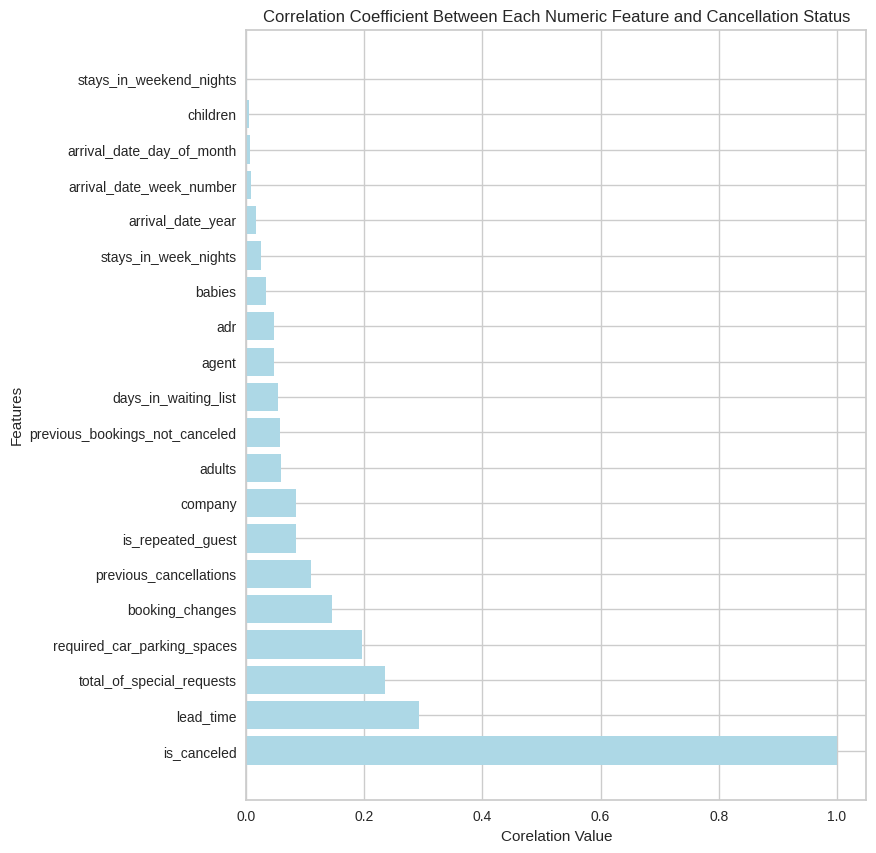

In [174]:
# Visualizing correlation coefficients between features and cancellation:
fig = plt.figure(figsize=(8,10))
plt.barh(Variable, Correlation,color='lightblue')
plt.title('Correlation Coefficient Between Each Numeric Feature and Cancellation Status')
plt.xlabel("Corelation Value")
plt.ylabel ("Features")


**Interpretation:**

Lead time is the most highly correlated feature with whether or not a booking
is canceled. It makes sense that as the number of days between when the booking is made and the supposed arrival date increases, customers have more time to cancel the reservation.

the total number of special requests is the second feature with the strongest correlation to our cancellation target. As the number of special requests made increases, the likelihood that a booking is canceled decreases. This suggests that engagement with the hotel prior to arrival and feeling like their needs are heard may make a customer less likely to cancel their reservation.

Related to special requests, the number of required car parking spaces is the third feature with the strongest correlation to our cancellation target. As the number of parking spaces requests increases, the likelihood that a booking is canceled decreases.

a customer's prior history with the hotel (measured by the number of previous bookings not canceled or whether or not a customer is a repeated guest) does not seem to be highly correlated with whether or not the current booking will be canceled. On the other hand, a customer's prior history of cancellation (measured by the number of previous cancellations is more highly correlated with whether or not the current booking will be canceled.

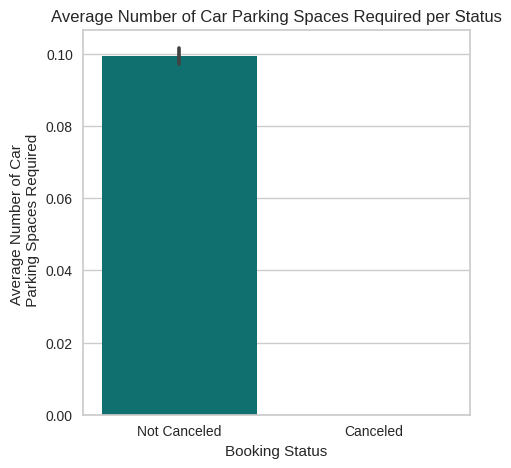

In [175]:
# Visualizing the total number of requested parking spaces for canceled and not canceled bookings:
plt.figure(figsize=(5,5))
plt.title("Average Number of Car Parking Spaces Required per Status")
sns.barplot(x=df['is_canceled'], y=df['required_car_parking_spaces'], palette=['teal', 'lightblue'])
plt.xlabel("Booking Status")
plt.ylabel("Average Number of Car \n Parking Spaces Required")
plt.xticks(ticks=[0, 1], labels=['Not Canceled', 'Canceled']);

**Interpretation: **

On average, customers who do not cancel their bookings tend to require more parking spaces. Similarly to the number of special requests, it would make sense that the more a customer engages with the hotel (by putting in a request for a parking spot), the less likely they are to cancel.

 from the hotel perpective, it is possible that not many hotels around have a parking. As a result, the need for a parking space would limit the customer in their hotel options and make them less likely to cancel.

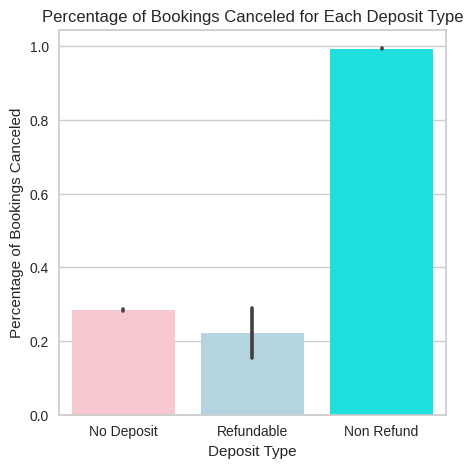

In [176]:
# Visualizing percentage of bookings canceled for each deposit type:
plt.figure(figsize=(5,5))
plt.title("Percentage of Bookings Canceled for Each Deposit Type")
sns.barplot(x=df['deposit_type'], y=df['is_canceled'], palette=['pink','lightblue','cyan'])
plt.xlabel("Deposit Type")
plt.ylabel("Percentage of Bookings Canceled");

**Interpretation: **

Surprisingly, customers who pay a non-refundable deposit have a much higher percentage of canceled reservations.

### 4. pre-processing

Select important Features using Co-relation for Machine Learning...


In [177]:
# group data on basis of is_canceled
data.groupby('is_canceled')['reservation_status'].value_counts()

is_canceled  reservation_status
0            Check-Out             75011
1            Canceled              42993
             No-Show                1206
Name: reservation_status, dtype: int64

In [178]:
#exclude the unneccessary features
list_not = ['days_in_waiting_list','arrival_date_year']

In [179]:
#excluding by the help of list comprehension
num_features=[col for col in data.columns if data[col].dtype!='O' and col not in list_not]
num_features

['is_canceled',
 'lead_time',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'stays_in_weekend_nights',
 'stays_in_week_nights',
 'adults',
 'children',
 'babies',
 'is_repeated_guest',
 'previous_cancellations',
 'previous_bookings_not_canceled',
 'booking_changes',
 'agent',
 'company',
 'adr',
 'required_car_parking_spaces',
 'total_of_special_requests']

In [180]:
'''cols=[]
for col in data.columns:
  if data[col].dtype!='o' and col not in list_not:
    cols.append(col)
cols '''

"cols=[]\nfor col in data.columns:\n  if data[col].dtype!='o' and col not in list_not:\n    cols.append(col)\ncols "

In [181]:
# excluding categorical data
cat_not=['arrival_date_year','assigned_room_type','booking_changes','reservation_status','country','days_in_waiting_list']
cat_not

['arrival_date_year',
 'assigned_room_type',
 'booking_changes',
 'reservation_status',
 'country',
 'days_in_waiting_list']

In [182]:
cat_features = [col for col in data.columns if data[col].dtype=='O' and col not in cat_not]
cat_features

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

 Extract derived features from data

In [183]:
data_cat=data[cat_features]
data_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,07-01-2015
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,07-01-2015
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,07-02-2015
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,07-02-2015
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,07-03-2015


In [184]:
data_cat.dtypes

hotel                      object
arrival_date_month         object
meal                       object
market_segment             object
distribution_channel       object
reserved_room_type         object
deposit_type               object
customer_type              object
reservation_status_date    object
dtype: object

In [185]:
#for ignoring the warning
import warnings
from warnings import filterwarnings
filterwarnings('ignore')

In [186]:
#converting reservation_status_date features from object to datetime
data_cat['reservation_status_date']=pd.to_datetime(data_cat['reservation_status_date'])

In [187]:
# extracting month ,years and days
data_cat['year']=data_cat['reservation_status_date'].dt.year
data_cat['month']=data_cat['reservation_status_date'].dt.month
data_cat['day']=data_cat['reservation_status_date'].dt.day
data_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date,year,month,day
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01,2015,7,1
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01,2015,7,1
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015-07-02,2015,7,2
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015-07-02,2015,7,2
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015-07-03,2015,7,3


In [188]:
#droping the column vertically
data_cat.drop('reservation_status_date',axis=1,inplace=True)

In [189]:
#adding new column beacouse is_canceled is int64 which is exactly object type
data_cat['cancellation']=data['is_canceled']
data_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day,cancellation
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1,0
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1,0
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015,7,2,0
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015,7,2,0
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015,7,3,0


apply feature Encoding techniques

(to convert string data into meaningfull numerical format using Encoding technique)

**Mean Encoding**

In [190]:
cols= data_cat.columns[0:8]
cols

Index(['hotel', 'arrival_date_month', 'meal', 'market_segment',
       'distribution_channel', 'reserved_room_type', 'deposit_type',
       'customer_type'],
      dtype='object')

In [191]:
# Perform Mean Encoding Technique

for col in cols:
    dict=data_cat.groupby([col])['cancellation'].mean().to_dict()
    data_cat[col]=data_cat[col].map(dict)
data_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day,cancellation
0,0.277674,0.374644,0.374106,0.153712,0.174868,0.330827,0.28402,0.407864,2015,7,1,0
1,0.277674,0.374644,0.374106,0.153712,0.174868,0.330827,0.28402,0.407864,2015,7,1,0
2,0.277674,0.374644,0.374106,0.153712,0.174868,0.391567,0.28402,0.407864,2015,7,2,0
3,0.277674,0.374644,0.374106,0.187618,0.220568,0.391567,0.28402,0.407864,2015,7,2,0
4,0.277674,0.374644,0.374106,0.367590,0.410598,0.391567,0.28402,0.407864,2015,7,3,0


In [192]:
dataframe=pd.concat([data_cat,data[num_features]],axis=1)
dataframe.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,...,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,0.277674,0.374644,0.374106,0.153712,0.174868,0.330827,0.28402,0.407864,2015,7,...,0,0,0,0,3,0.0,0.0,0.0,0,0
1,0.277674,0.374644,0.374106,0.153712,0.174868,0.330827,0.28402,0.407864,2015,7,...,0,0,0,0,4,0.0,0.0,0.0,0,0
2,0.277674,0.374644,0.374106,0.153712,0.174868,0.391567,0.28402,0.407864,2015,7,...,0,0,0,0,0,0.0,0.0,75.0,0,0
3,0.277674,0.374644,0.374106,0.187618,0.220568,0.391567,0.28402,0.407864,2015,7,...,0,0,0,0,0,304.0,0.0,75.0,0,0
4,0.277674,0.374644,0.374106,0.367590,0.410598,0.391567,0.28402,0.407864,2015,7,...,0,0,0,0,0,240.0,0.0,98.0,0,1


In [193]:
dataframe.drop(['cancellation'],axis=1,inplace=True)
dataframe.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,...,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,0.277674,0.374644,0.374106,0.153712,0.174868,0.330827,0.28402,0.407864,2015,7,...,0,0,0,0,3,0.0,0.0,0.0,0,0
1,0.277674,0.374644,0.374106,0.153712,0.174868,0.330827,0.28402,0.407864,2015,7,...,0,0,0,0,4,0.0,0.0,0.0,0,0
2,0.277674,0.374644,0.374106,0.153712,0.174868,0.391567,0.28402,0.407864,2015,7,...,0,0,0,0,0,0.0,0.0,75.0,0,0
3,0.277674,0.374644,0.374106,0.187618,0.220568,0.391567,0.28402,0.407864,2015,7,...,0,0,0,0,0,304.0,0.0,75.0,0,0
4,0.277674,0.374644,0.374106,0.367590,0.410598,0.391567,0.28402,0.407864,2015,7,...,0,0,0,0,0,240.0,0.0,98.0,0,1


In [194]:
dataframe.shape

(119210, 29)

Handling outliers

<Axes: xlabel='lead_time', ylabel='Density'>

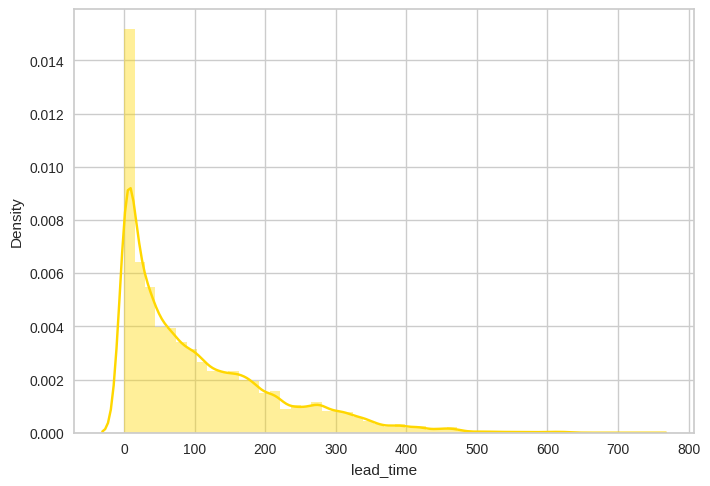

In [195]:
 #showing outliers with distribution curve
sns.distplot(dataframe['lead_time'], color='gold')

Conclusion:

the distribution of this features is little bit right skewed. we are going to replace the value of its original feature from it log value, so that the skeweness will get solved.

In [196]:
#defining and calling function for handling outlier
def handle_outlier(col):
    dataframe[col]=np.log1p(dataframe[col])
handle_outlier('lead_time')

<Axes: xlabel='lead_time', ylabel='Density'>

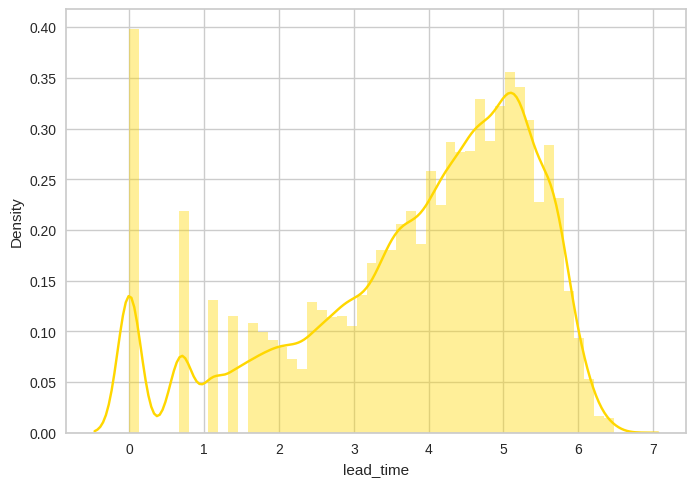

In [197]:
sns.distplot(dataframe['lead_time'], color='gold')

<Axes: xlabel='adr', ylabel='Density'>

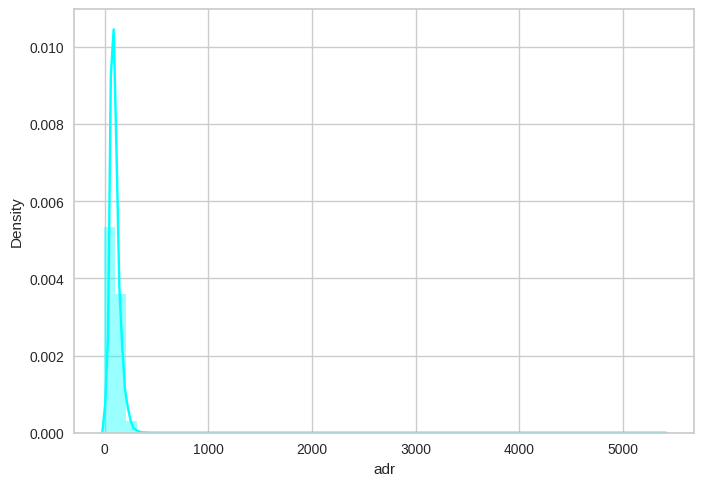

In [198]:
#handling outlier for adr feature
sns.distplot(dataframe['adr'], color='cyan')

In [199]:
handle_outlier('adr')

<Axes: xlabel='adr', ylabel='Density'>

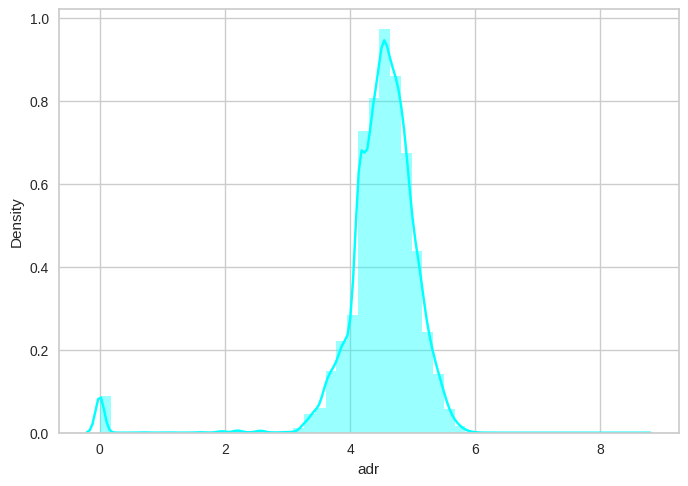

In [200]:
sns.distplot(dataframe['adr'], color='cyan')

Apply Techniques of features Importance on data to select most important features.

In [201]:
dataframe.isnull().sum()

hotel                             0
arrival_date_month                0
meal                              0
market_segment                    0
distribution_channel              0
reserved_room_type                0
deposit_type                      0
customer_type                     0
year                              0
month                             0
day                               0
is_canceled                       0
lead_time                         0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
booking_changes                   0
agent                             0
company                           0
adr                               1
required_car_parking_spaces 

In [202]:
dataframe.dropna(inplace=True)

In [203]:
#defining dependent(y) variable and independent (x) variable
y = dataframe['is_canceled']
x = dataframe.drop('is_canceled', axis =1)

In [204]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel


Lasso(alpha=0.005)

 select a suitable alpha (equivalent of penalty).

 The bigger the alpha the less features that will be selected.


In [205]:
feature_sel_model=SelectFromModel(Lasso(alpha=0.005,random_state=0))

In [206]:
feature_sel_model.fit(x,y)

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [207]:
feature_sel_model.get_support()
#if true that feature get selected and have value for machine learning model and if false that feature dont have value for the same

array([False, False, False, False, False, False,  True, False,  True,
        True,  True,  True,  True, False, False, False,  True,  True,
       False, False,  True, False,  True, False,  True,  True,  True,
        True])

In [208]:
cols=x.columns
cols

Index(['hotel', 'arrival_date_month', 'meal', 'market_segment',
       'distribution_channel', 'reserved_room_type', 'deposit_type',
       'customer_type', 'year', 'month', 'day', 'lead_time',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'adr', 'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

In [209]:
# let's print the number of selected features

selected_feature=cols[feature_sel_model.get_support()]
selected_feature

Index(['deposit_type', 'year', 'month', 'day', 'lead_time',
       'arrival_date_week_number', 'adults', 'children',
       'previous_cancellations', 'booking_changes', 'company', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

In [210]:
x=x[selected_feature]
x

,deposit_type,year,month,day,lead_time,arrival_date_week_number,adults,children,previous_cancellations,booking_changes,company,adr,required_car_parking_spaces,total_of_special_requests
0,0.28402,2015,7,1,5.837730,27,2,0.0,0,3,0.0,0.000000,0,0
1,0.28402,2015,7,1,6.603944,27,2,0.0,0,4,0.0,0.000000,0,0
2,0.28402,2015,7,2,2.079442,27,1,0.0,0,0,0.0,4.330733,0,0
3,0.28402,2015,7,2,2.639057,27,1,0.0,0,0,0.0,4.330733,0,0
4,0.28402,2015,7,3,2.708050,27,2,0.0,0,0,0.0,4.595120,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,0.28402,2017,9,6,3.178054,35,2,0.0,0,0,0.0,4.576153,0,0
119386,0.28402,2017,9,7,4.634729,35,3,0.0,0,0,0.0,5.422436,0,2
119387,0.28402,2017,9,7,3.555348,35,2,0.0,0,0,0.0,5.067079,0,4
119388,0.28402,2017,9,7,4.700480,35,2,0.0,0,0,0.0,4.657763,0,0


### 5.building Machine Learning Model

In [211]:
#importing train_test_split from sklearn module
from sklearn.model_selection import train_test_split

In [212]:
# spliting the data
X_train, X_test, y_train, y_test = train_test_split( x, y, test_size=0.25,random_state=0)

In [213]:
# importinmg LogesticRegression model from sklearn module
from sklearn.linear_model import LogisticRegression

In [214]:
# fitting the data in the model
logreg=LogisticRegression()
logreg.fit(X_train,y_train)

LogisticRegression()

In [215]:
# predicting the value of test data [1:for cancelled ,0: for not cancelled]
y_pred=logreg.predict(X_test)
y_pred

array([1, 0, 0, ..., 0, 1, 1])

In [216]:
# importing confusion matrix
from sklearn.metrics import confusion_matrix

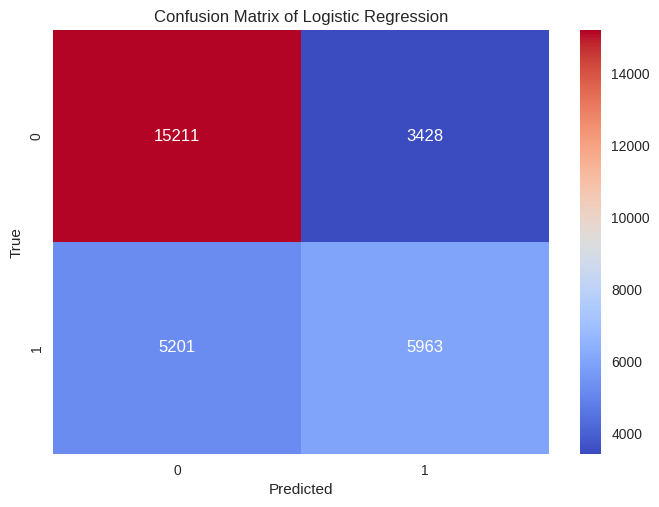

In [217]:
#plotting confusion matrix of logistic Regression
logreg_matrix = confusion_matrix(y_test,y_pred)
sns.heatmap(logreg_matrix, annot=True, fmt='d', cmap='coolwarm')
plt.title('Confusion Matrix of Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [218]:
# checking the accuracy of model
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [219]:
accuracy_score(y_test,y_pred)

0.7104653893903299

conclusion :

this is not the correct accuracy of this model we need to do cross validation to get the correct the accuracy of model.

### 6. cross-validation

In [220]:
#importing cross_val_score
from sklearn.model_selection import cross_val_score

In [221]:
# checking the score and storing it in variable
score=cross_val_score(logreg,x,y,cv=10)
score

array([0.67116853, 0.7225065 , 0.70673601, 0.73072729, 0.71772502,
       0.73718648, 0.57746833, 0.75253754, 0.72695244, 0.71291946])

In [222]:
# calculating the mean of cross validation score
score.mean()

0.7055927599988515

Since the logistic regression model does not provide predictive power as high as we would like, we will attempt other machine learning algorithm.

### 7.multi algorithm

In [223]:
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

In [224]:
models=[]

models.append(('Naive_bayes',GaussianNB()))
models.append(('Random Forest',RandomForestClassifier()))
models.append(('Decision_tree',DecisionTreeClassifier()))

Naive_bayes
confusion matrix: 


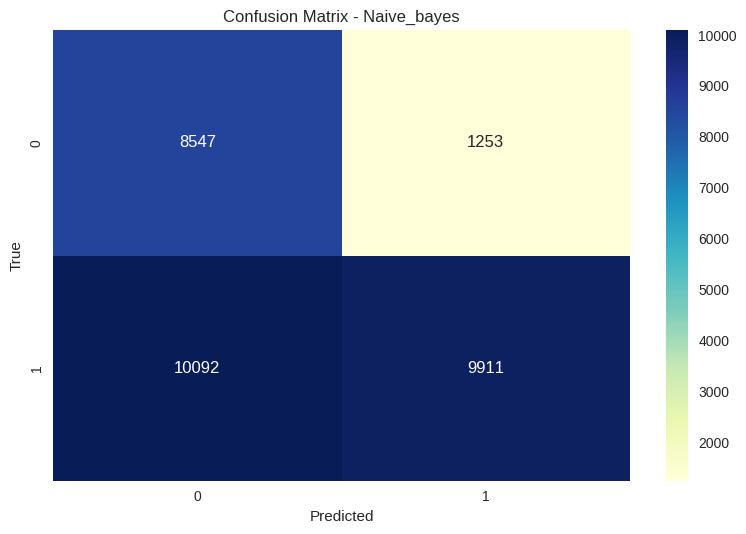

accuracy score:  0.6193336241317988
CV accuracy score:  0.5872956872396521
              precision    recall  f1-score   support

           0       0.75      0.82      0.78     18639
           1       0.63      0.53      0.58     11164

    accuracy                           0.71     29803
   macro avg       0.69      0.68      0.68     29803
weighted avg       0.70      0.71      0.70     29803



Random Forest
confusion matrix: 


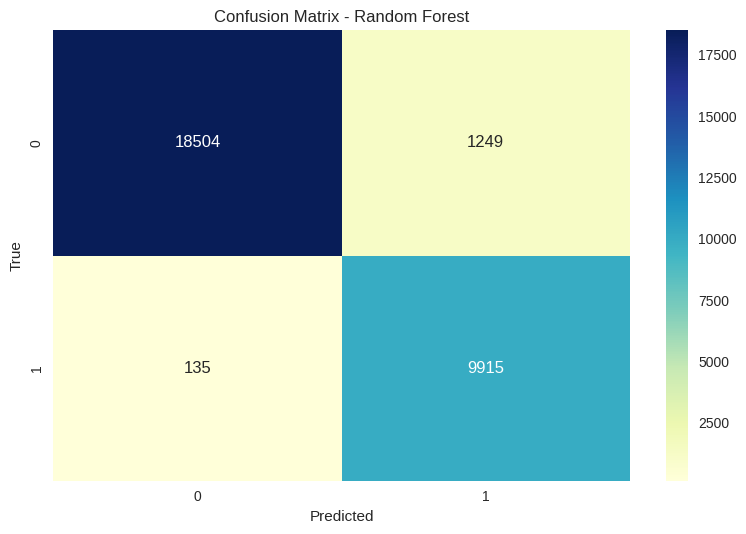

accuracy score:  0.9535617219742979
CV accuracy score:  0.7696821700636572
              precision    recall  f1-score   support

           0       0.75      0.82      0.78     18639
           1       0.63      0.53      0.58     11164

    accuracy                           0.71     29803
   macro avg       0.69      0.68      0.68     29803
weighted avg       0.70      0.71      0.70     29803



Decision_tree
confusion matrix: 


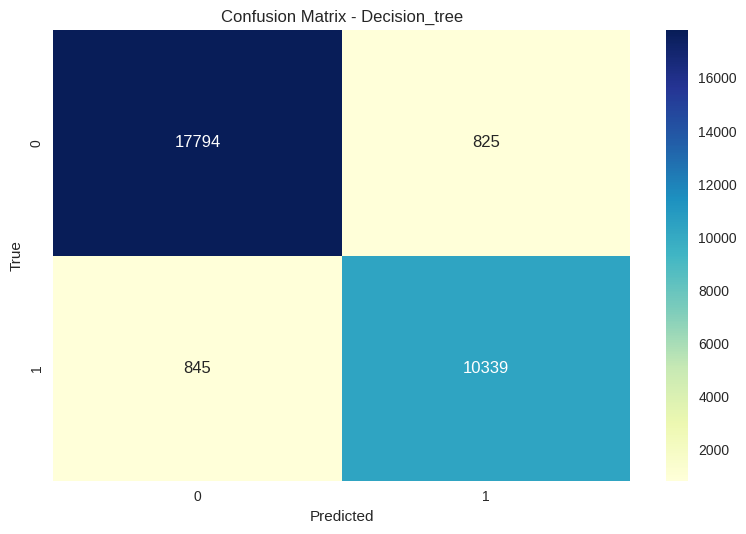

accuracy score:  0.9439653726134953
CV accuracy score:  0.8011980500543567
              precision    recall  f1-score   support

           0       0.75      0.82      0.78     18639
           1       0.63      0.53      0.58     11164

    accuracy                           0.71     29803
   macro avg       0.69      0.68      0.68     29803
weighted avg       0.70      0.71      0.70     29803





In [225]:
for name,model in models:
    print(name)
    model.fit(X_train,y_train)

    predictions=model.predict(X_test)

    cm=confusion_matrix(predictions,y_test)
    print("confusion matrix: ")
    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()

    acc=accuracy_score(predictions,y_test)
    print("accuracy score: ",acc)

    score=cross_val_score(model,x,y,cv=10)
    print('CV accuracy score: ',score.mean())

    report = classification_report(y_test, y_pred)
    print(report)

    print('\n')

### 8.Model Evolution and comparison

In [226]:
accuracy = [0.71,0.61,0.95,0.94]
model = ['LogisticRegression','Naive_bayes','RandomForest','Decision_tree']

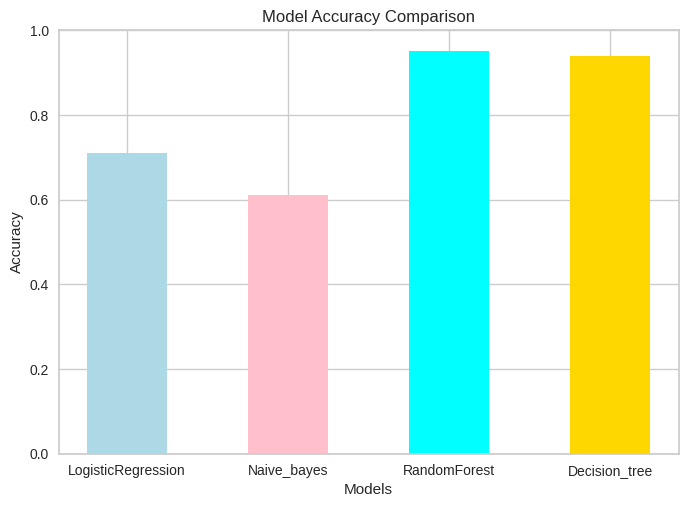

In [227]:
plt.bar(model, accuracy, color=['lightblue', 'pink', 'cyan', 'gold'],width=0.5)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim(0, 1)  # Set y-axis limit to better visualize differences

plt.show()

### 9.conclusion

**Conclusion:**

*   hotel_booking.csv dataset is a supervised classification dataset.
*   Among these four machine learning algorithms, Random forest and Decision trees perform well with respect to accuracy.
*  This models classifies whether or not a booking will be canceled with 95% and 94% accuracy.
*   Our EDA (Exploratory data analysis ) explain a non-refundable deposit and requiring parking spaces are the two features influencing cancellation prediction the most.
*   Our analysis also pointed at the importance of lead time, number of special requests, and room type.
*   we discovered that a deeper understanding of the situation may require additional hotel specific information (such as surrounding parking availability or deposit policies).




